<a href="https://colab.research.google.com/github/benjacd/t3_mineria/blob/main/Mineria_taller3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Importacion librerias basicas
#https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset?datasetId=1703281&sortBy=voteCount&select=diabetes_binary_5050split_health_indicators_BRFSS2015.csv set de datos
import numpy as np
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model
from scipy import stats
import plotly.express as px
import plotly.graph_objs as go
from mlxtend.plotting import plot_confusion_matrix
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# importando el DataSet,se utilizara la opcion balanceada con 50% de casos de diabetes y 50% de casos sin diabetes, se usara para entrenar al modelo de mejor manera, explicar en informe.
pd.set_option('display.max_columns', None)
o_data=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Taller 3/diabetes_binary_5050split_health_indicators_BRFSS2015.csv', sep = ",") #o_data Data original

In [ ]:
#Variable target: Diabetes_binary, Hay que hacer un diccionario de datos en el informe ojoo!!! https://www.kaggle.com/code/alexteboul/diabetes-health-indicators-dataset-notebook
o_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70692 entries, 0 to 70691
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       70692 non-null  float64
 1   HighBP                70692 non-null  float64
 2   HighChol              70692 non-null  float64
 3   CholCheck             70692 non-null  float64
 4   BMI                   70692 non-null  float64
 5   Smoker                70692 non-null  float64
 6   Stroke                70692 non-null  float64
 7   HeartDiseaseorAttack  70692 non-null  float64
 8   PhysActivity          70692 non-null  float64
 9   Fruits                70692 non-null  float64
 10  Veggies               70692 non-null  float64
 11  HvyAlcoholConsump     70692 non-null  float64
 12  AnyHealthcare         70692 non-null  float64
 13  NoDocbcCost           70692 non-null  float64
 14  GenHlth               70692 non-null  float64
 15  MentHlth           

In [ ]:
#Primer acercamiento de datos, no se ven outliers a primera vista, la mayoria de los columnas estan trabajadas en rangos.
o_data.describe()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000
mean,0.500000,0.563458,0.525703,0.975259,29.856985,0.475273,0.062171,0.147810,0.703036,0.611795,0.788774,0.042721,0.954960,0.093914,2.837082,3.752037,5.810417,0.252730,0.456997,8.584055,4.920953,5.698311
std,0.500004,0.495960,0.499342,0.155336,7.113954,0.499392,0.241468,0.354914,0.456924,0.487345,0.408181,0.202228,0.207394,0.291712,1.113565,8.155627,10.062261,0.434581,0.498151,2.852153,1.029081,2.175196
min,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,7.000000,4.000000,4.000000
50%,0.500000,1.000000,1.000000,1.000000,29.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,9.000000,5.000000,6.000000
75%,1.000000,1.000000,1.000000,1.000000,33.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,4.000000,2.000000,6.000000,1.000000,1.000000,11.000000,6.000000,8.000000
max,1.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


In [ ]:
o_data.head(5)

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0


Grafica variables relevantes.

In [ ]:
#Se grafica diabetes por genero, Se observa que la diabetes es igual por generos, habiendo ligeramente mas mujeres con diabetes, variable objetivo = Diabetes_binary	
hombre = o_data[o_data['Sex']==1]
mujer = o_data[o_data['Sex']==0]

hombre_d = hombre[o_data['Diabetes_binary']==1]
hombre_s = hombre[o_data['Diabetes_binary']==0]
mujer_d = mujer[o_data['Diabetes_binary']==1]
mujer_s = mujer[o_data['Diabetes_binary']==0]

labels = ['Hombre sano', 'Hombre con diabetes', 'Mujer sana', 'Mujer con diabetes']
values = [len(hombre_s), len(hombre_d), len(mujer_s), len(mujer_d)]
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.4)])
fig.update_layout(
    title_text="Analisis de diabetes por genero")
fig.show()
                                                                                                                                                          

In [ ]:
#Conclusiones interesantes, Hombres con diabetes mayor en los rangos 10 y 11 al igual que mujeres
fig = px.violin(o_data, y="Age", x="Sex", color="Diabetes_binary", box=True, points="all", hover_data=o_data.columns)
fig.update_layout(title_text="Analisis de edad y genero en la diabetes")
fig.show()

In [ ]:
#Conclusiones interesantes, HighBP se muestra altamente relacionado con la diabetes, personas con high bp con mas diabetes en los rangos 10 que gente con bajos bajos bp, mas gente con high bp entre rangos 10 a 14
fig = px.violin(o_data, y="Age", x="HighBP", color="Diabetes_binary", box=True, points="all", hover_data=o_data.columns)
fig.update_layout(title_text="Analisis de edad y HighBP en la diabetes")
fig.show()

In [ ]:
cols = ['HighChol','Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'DiffWalk']

In [ ]:
def create_plot_pivot(data2, x_column):
    _df_plot = data2.groupby([x_column, 'Diabetes_binary']).size() \
    .reset_index().pivot(columns='Diabetes_binary', index=x_column, values=0)
    return _df_plot

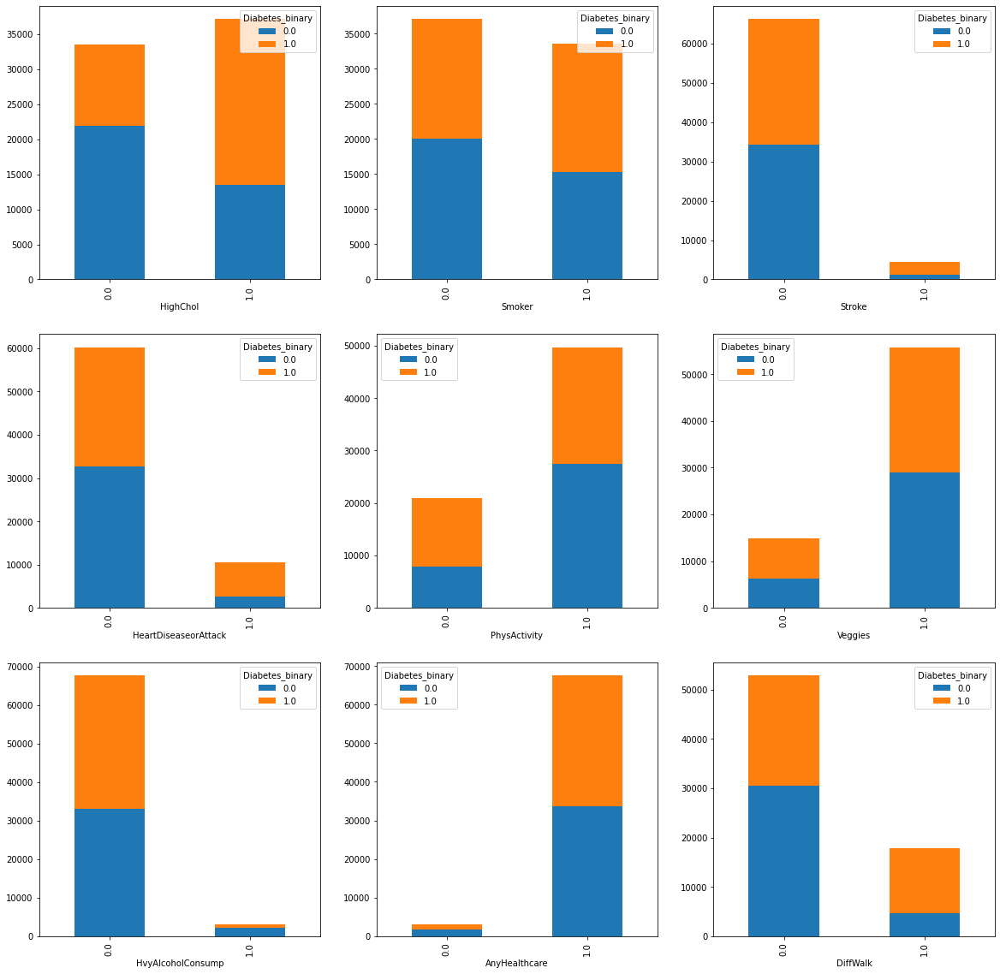

In [ ]:
fig, ax = plt.subplots(3, 3, figsize=(20,20))
axe = ax.ravel()

c = len(cols)

for i in range(c):
    create_plot_pivot(o_data, cols[i]).plot(kind='bar',stacked=True, ax=axe[i])
    axe[i].set_xlabel(cols[i])

PRE PROCESAMIENTO DE DATOS.

In [ ]:
#Verificacion de datos nulos.   No se encuentran datos nulos to bn
total = o_data.isnull().sum().sort_values(ascending = False)
percent = (o_data.isnull().sum() / o_data.isnull().count()).sort_values(ascending = False)
missing_data = pd.concat([total, percent], axis = 1, keys = ['Total', 'Percent'])
missing_data.head(10)

,Total,Percent
Diabetes_binary,0,0.0
HighBP,0,0.0
Education,0,0.0
Age,0,0.0
Sex,0,0.0
DiffWalk,0,0.0
PhysHlth,0,0.0
MentHlth,0,0.0
GenHlth,0,0.0
NoDocbcCost,0,0.0


In [ ]:
#Verificacion de datos duplicados, se encuentran datos duplicados
o_data.duplicated().sum()

1635

In [ ]:
#Creacion df para trabajar datos, eliminacion datos duplicados.
df = o_data
df.drop_duplicates(inplace = True)
df.duplicated().sum()

0

In [ ]:
#Transformacion datos a enteros, ya que son rangos y no se encuentran valores decimales.
df["Diabetes_binary"] = df["Diabetes_binary"].astype(int)
df["HighBP"] = df["HighBP"].astype(int)
df["HighChol"] = df["HighChol"].astype(int)
df["CholCheck"] = df["CholCheck"].astype(int)
df["BMI"] = df["BMI"].astype(int)
df["Smoker"] = df["Smoker"].astype(int)
df["Stroke"] = df["Stroke"].astype(int)
df["HeartDiseaseorAttack"] = df["HeartDiseaseorAttack"].astype(int)
df["PhysActivity"] = df["PhysActivity"].astype(int)
df["Fruits"] = df["Fruits"].astype(int) 
df["Veggies"] = df["Veggies"].astype(int)
df["HvyAlcoholConsump"] = df["HvyAlcoholConsump"].astype(int)
df["AnyHealthcare"] = df["AnyHealthcare"].astype(int)
df["NoDocbcCost"] = df["NoDocbcCost"].astype(int)
df["GenHlth"] = df["GenHlth"].astype(int)
df["MentHlth"] = df["MentHlth"].astype(int)
df["PhysHlth"] = df["PhysHlth"].astype(int)
df["DiffWalk"] = df["DiffWalk"].astype(int)
df["Sex"] = df["Sex"].astype(int)
df["Age"] = df["Age"].astype(int)
df["Education"] = df["Education"].astype(int)
df["Income"] =df["Income"].astype(int)

In [ ]:
#Datos transformados a enteros, todo bn
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69057 entries, 0 to 70691
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Diabetes_binary       69057 non-null  int64
 1   HighBP                69057 non-null  int64
 2   HighChol              69057 non-null  int64
 3   CholCheck             69057 non-null  int64
 4   BMI                   69057 non-null  int64
 5   Smoker                69057 non-null  int64
 6   Stroke                69057 non-null  int64
 7   HeartDiseaseorAttack  69057 non-null  int64
 8   PhysActivity          69057 non-null  int64
 9   Fruits                69057 non-null  int64
 10  Veggies               69057 non-null  int64
 11  HvyAlcoholConsump     69057 non-null  int64
 12  AnyHealthcare         69057 non-null  int64
 13  NoDocbcCost           69057 non-null  int64
 14  GenHlth               69057 non-null  int64
 15  MentHlth              69057 non-null  int64
 16  Phys

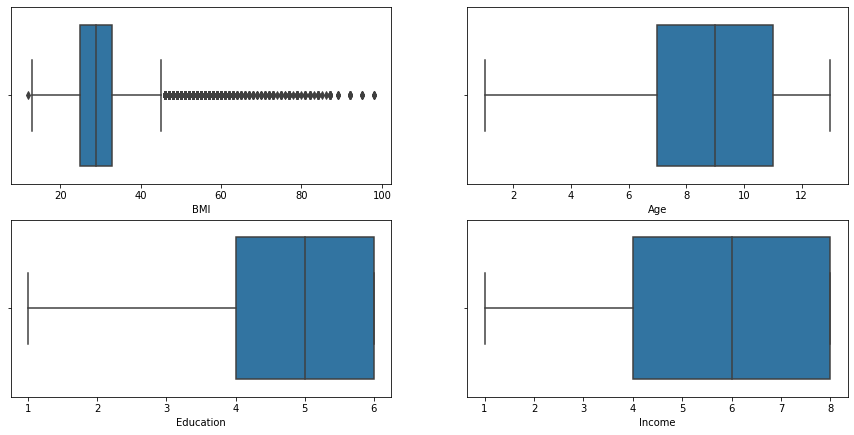

In [ ]:
#Busqueda de outliers
#Variables con posibilidad de outliers BMI, se encuentra outliers en bmi, estos son limpiados
plt.figure(figsize = (15,15))
for i,col in enumerate(['BMI', 'Age','Education', 'Income']):
    plt.subplot(4,2,i+1)
    sns.boxplot(x = col, data = df)
plt.show()

(array([  278.,  2248.,  7729., 12853., 14715., 11427.,  7781.,  4799.,
         2858.,  2180.]),
 array([14. , 17.1, 20.2, 23.3, 26.4, 29.5, 32.6, 35.7, 38.8, 41.9, 45. ]),
 <a list of 10 Patch objects>)

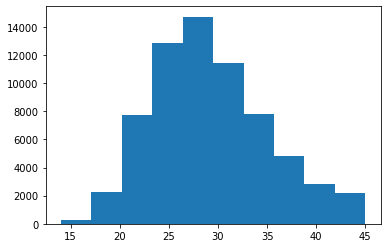

In [ ]:
#Outliers sobre 45 con la regla del 1.5
df.drop(df.index[df['BMI'] > 45], inplace = True)
df.drop(df.index[df['BMI'] < 14], inplace = True)
plt.hist(df['BMI'],bins = 10)

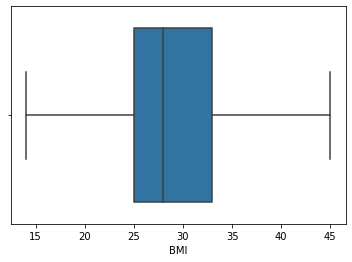

In [ ]:
#Variable sin outliers
sns.boxplot (x = 'BMI', data = df)

Modelo propuesto, analisis corelacion

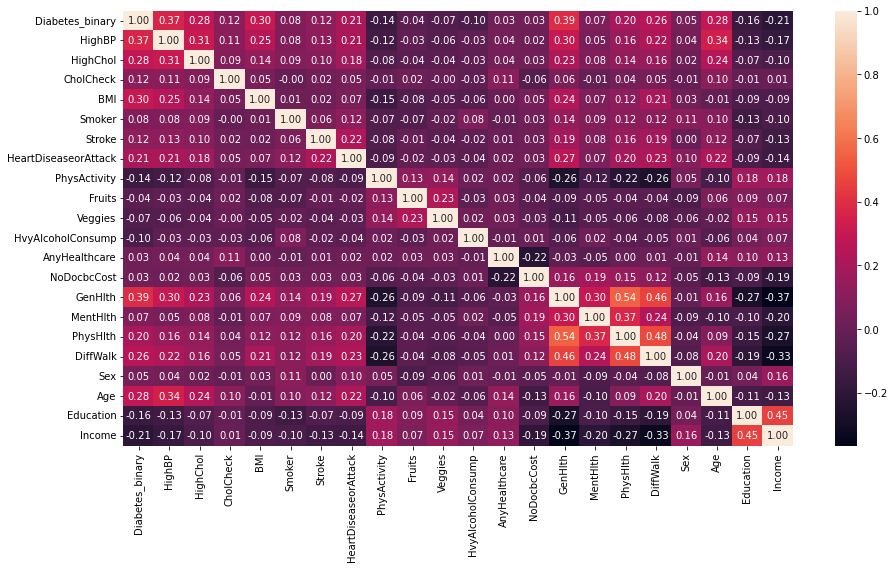

In [ ]:
plt.figure(figsize = (15,8)) #Mayores relaciones directas con la diabetes, high bp, high chol, bmi, heart disease or attack, genhlth,psyhelt, diff walk, age
sns.heatmap(df.corr(),annot=True, fmt="0.2f") #Mayores relaciones inversas income, education, interesante

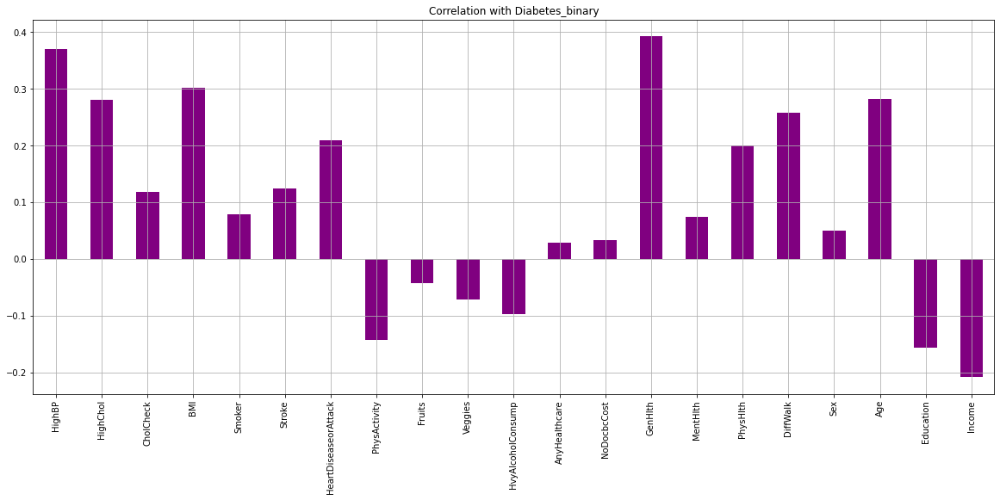

In [ ]:
#Grafico mas en detalle de las correlaciones.
df.drop('Diabetes_binary', axis=1).corrwith(df.Diabetes_binary).plot(kind='bar', grid=True, figsize=(20, 8)
, title="Correlation with Diabetes_binary",color="Purple");
#Mayores correlaciones positivas, genhlt, highbp, highchol,bmi, heartdisease attackt, diff walk, age,physhlth se tomaran mas mayores a .2
#Mayores correlaciones negativas, Education incme, physactivity se tomaran mayores a .1

Modelado

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 66868 entries, 0 to 70691
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Diabetes_binary       66868 non-null  int64
 1   HighBP                66868 non-null  int64
 2   HighChol              66868 non-null  int64
 3   CholCheck             66868 non-null  int64
 4   BMI                   66868 non-null  int64
 5   Smoker                66868 non-null  int64
 6   Stroke                66868 non-null  int64
 7   HeartDiseaseorAttack  66868 non-null  int64
 8   PhysActivity          66868 non-null  int64
 9   Fruits                66868 non-null  int64
 10  Veggies               66868 non-null  int64
 11  HvyAlcoholConsump     66868 non-null  int64
 12  AnyHealthcare         66868 non-null  int64
 13  NoDocbcCost           66868 non-null  int64
 14  GenHlth               66868 non-null  int64
 15  MentHlth              66868 non-null  int64
 16  Phys

In [ ]:
#Se tomaran las variables que mas correlacion tienen elegidas en el paso anterior por lo cual de variables independientes, y de variable dependiente el Diabetes_binary

VI = ['HighBP','HighChol','BMI', 'HeartDiseaseorAttack', 'GenHlth','PhysHlth','DiffWalk','Age', 'PhysActivity','Education', 'Income','HvyAlcoholConsump'] #Variables independientes
VD = ['Diabetes_binary'] #Variable dependiente
x = df[VI]
y = df[VD]
x_train,x_test,y_train,y_test = train_test_split(x,y, test_size=0.3, random_state=2) #Metodo train test split para definir las variables y el testeo, el tamaño de prueba sera del 30% de los datos y una semilla


In [ ]:
#Modelo random Forest https://www.youtube.com/watch?v=v6VJ2RO66Ag video de como funciona pq hay que explicarlo
#Documentacion random forest https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html ahi que es cada variable
r_clf = RandomForestClassifier(max_features=1, max_depth=15, random_state=1)
r_clf.fit(x_train, y_train)
r_pred = r_clf.predict(x_test)
r_acc = accuracy_score(y_test, r_pred)


In [ ]:
#Rendimiento del random forest 
print("R2 =  ", "{:.2f}%".format(100* r_acc))

R2 =   73.23%


<Figure size 432x288 with 0 Axes>

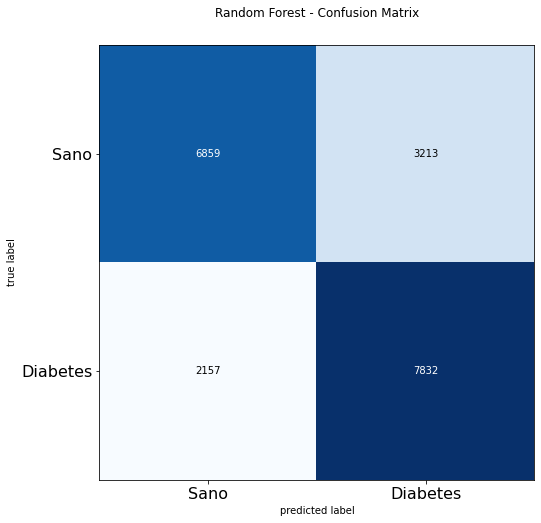

In [ ]:
#Matriz de confusion indica cantidad de detecciones erroneas de las pruebas
cm = confusion_matrix(y_test, r_pred)
plt.figure()
plot_confusion_matrix(cm, figsize=(12,8), hide_ticks=True, cmap=plt.cm.Blues)
plt.title("Random Forest - Confusion Matrix")
plt.xticks(range(2), ["Sano","Diabetes"], fontsize=16)
plt.yticks(range(2), ["Sano","Diabetes"], fontsize=16)
plt.show()